In [40]:
import pandas as pd

def get_file_path():
    import os
    # Load the data
    if os.path.exists('/kaggle'):
        file_path = '/kaggle/input/state-of-data-brazil-2023/State_of_data_BR_2023_Kaggle - df_survey_2023.csv'
    else:
        default_directory = '/home/nerton/TRABALHO/Projects/kaggle'
        os.chdir(default_directory)
        file_path = './input/state-of-data-brazil-2023⁄State_of_data_BR_2023_Kaggle.csv'
    return file_path

# Carregando o DataFrame
file_path = get_file_path()
df = pd.read_csv(file_path)


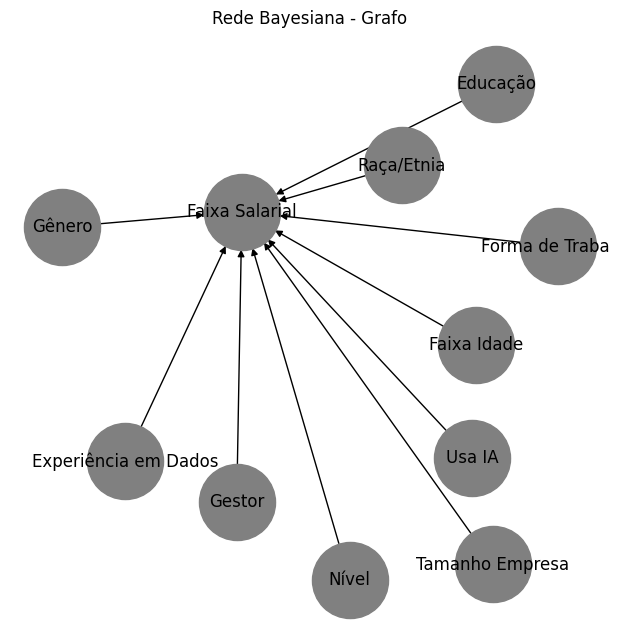

In [41]:
from pgmpy.models import DiscreteBayesianNetwork
import networkx as nx

# Exemplo de grafo: todas apontam para faixa salarial
graph = DiscreteBayesianNetwork([
    # Fatores demográficos
    ("Faixa Idade", "Faixa Salarial"),
    ("Gênero", "Faixa Salarial"),
    ("Raça/Etnia", "Faixa Salarial"),
    ("Educação", "Faixa Salarial"),

    # Fatores profissionais
    ("Experiência em Dados", "Faixa Salarial"),
    ("Nível", "Faixa Salarial"),
    ("Gestor", "Faixa Salarial"),
    #("Setor", "Faixa Salarial"),
    ("Tamanho Empresa", "Faixa Salarial"),

    # Fatores modernos (IA e trabalho remoto)
    ("Forma de Trabalho", "Faixa Salarial"),
    ("Usa IA", "Faixa Salarial"),

    # Relações indiretas
    #("Experiência em Dados", "Nível"),  # Mais experiência → Nível mais alto
    #("Educação", "Gestor"),             # Maior educação → Mais chance de ser gestor
    #("Setor", "Usa IA"),                # Setores diferentes têm diferentes níveis de adoção de IA
])
# Adicionando as arestas ao grafo
grafo = nx.DiGraph()
edges = graph.edges()
grafo.add_edges_from(edges)

plt.figure(figsize=(6, 6))
nx.draw(grafo, with_labels = True, node_color = 'grey', edge_color = 'black', node_size = 3000, font_size = 12)
plt.title("Rede Bayesiana - Grafo")
plt.show()




In [42]:
# Selecionar colunas do DataFrame
dados_rede = df[[
    "('P1_a_1 ', 'Faixa idade')",           # Faixa etária
    "('P1_b ', 'Genero')",                  # Gênero
    "('P1_c ', 'Cor/raca/etnia')",          # Raça/Etnia
    "('P1_l ', 'Nivel de Ensino')",         # Educação
    "('P2_i ', 'Quanto tempo de experiência na área de dados você tem?')",  # Experiência
    "('P2_d ', 'Gestor?')",                 # É gestor?
    "('P2_g ', 'Nivel')",                   # Nível (Júnior/Pleno/Sênior)
    "('P2_b ', 'Setor')",                   # Setor (TI, Finanças, Saúde...)
    "('P2_c ', 'Numero de Funcionarios')",  # Tamanho da empresa
    "('P2_r ', 'Atualmente qual a sua forma de trabalho?')",  # Remoto/Híbrido/Presencial
    "('P4_m ', 'Utiliza ChatGPT ou LLMs no trabalho?')",      # Uso de IA
    "('P2_h ', 'Faixa salarial')"           # VARIÁVEL TARGET (alvo)
]].copy()

# Renomear colunas
dados_rede.columns = [
    "Faixa Idade",
    "Gênero",
    "Raça/Etnia",
    "Educação",
    "Experiência em Dados",
    "Gestor",
    "Nível",
    "Setor",
    "Tamanho Empresa",
    "Forma de Trabalho",
    "Uso IA",
    "Faixa Salarial"  # Target
]

In [43]:
# Separar variáveis categóricas e numéricas
quali = []  # Lista para variáveis categóricas
quanti = []  # Lista para variáveis numéricas

for column in df.columns:
    # Verificar o tipo de dado da coluna
    if df[column].dtype == 'object' or df[column].dtype.name == 'category':
        quali.append(column)  # Adicionar à lista de categóricas
    elif pd.api.types.is_numeric_dtype(df[column]):
        quanti.append(column)  # Adicionar à lista de numéricas

# Exibir as listas de variáveis categóricas e numéricas
print("\n=== Variáveis Categóricas (quali) ===")
for var in quali:
    print(f"- {var}")

print("\n=== Variáveis Numéricas (quanti) ===")
for var in quanti:
    print(f"- {var}")


=== Variáveis Categóricas (quali) ===
- ('P0', 'id')
- ('P1_a_1 ', 'Faixa idade')
- ('P1_b ', 'Genero')
- ('P1_c ', 'Cor/raca/etnia')
- ('P1_d ', 'PCD')
- ('P1_e ', 'experiencia_profissional_prejudicada')
- ('P1_f ', 'aspectos_prejudicados')
- ('P1_i ', 'Estado onde mora')
- ('P1_i_1 ', 'uf onde mora')
- ('P1_i_2 ', 'Regiao onde mora')
- ('P1_k ', 'Regiao de origem')
- ('P1_l ', 'Nivel de Ensino')
- ('P1_m ', 'Área de Formação')
- ('P2_a ', 'Qual sua situação atual de trabalho?')
- ('P2_b ', 'Setor')
- ('P2_c ', 'Numero de Funcionarios')
- ('P2_e ', 'Cargo como Gestor')
- ('P2_f ', 'Cargo Atual')
- ('P2_g ', 'Nivel')
- ('P2_h ', 'Faixa salarial')
- ('P2_i ', 'Quanto tempo de experiência na área de dados você tem?')
- ('P2_j ', 'Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?')
- ('P2_l ', 'Qual o principal motivo da sua insatisfação com a empresa atual?')
- ('P2_m ', 'Você participou de entrevistas de emprego no

In [44]:
import pandas as pd
from scipy.stats import chi2_contingency

# List of predictor variables
variaveis_preditoras = [
    "('P1_a_1 ', 'Faixa idade')", 
    "('P1_b ', 'Genero')", 
    "('P1_c ', 'Cor/raca/etnia')", 
    "('P1_l ', 'Nivel de Ensino')", 
    "('P2_i ', 'Quanto tempo de experiência na área de dados você tem?')", 
    "('P2_d ', 'Gestor?')", 
    "('P2_g ', 'Nivel')", 
    "('P2_c ', 'Numero de Funcionarios')", 
    "('P2_r ', 'Atualmente qual a sua forma de trabalho?')", 
    "('P4_m ', 'Utiliza ChatGPT ou LLMs no trabalho?')"
]
dependente = "('P2_h ', 'Faixa salarial')"

# Perform association test
for var in quali:
    try:
        # Check if columns exist in DataFrame
        if var in df.columns and dependente in df.columns:
            # Remove missing values
            subset = df[[var, dependente]].dropna()
            
            # Ensure we're working with 1D data by converting to string if needed
            var_data = subset[var].astype(str)
            dep_data = subset[dependente].astype(str)
            
            # Create contingency table
            tabela = pd.crosstab(var_data, dep_data)
            
            # Check if table is empty or has only one category
            if tabela.empty:
                print(f"Empty contingency table for variable {var}.")
                continue
            if len(tabela.index) < 2 or len(tabela.columns) < 2:
                print(f"Not enough categories for chi-square test in variable {var}.")
                continue
            
            # Chi-square test
            chi2, p, _, _ = chi2_contingency(tabela)
            
            # Display results
            print(f"Variable: {var}")
            print(f"Chi-square: {chi2:.2f}, p-value: {p:.4f}")
            print("-" * 40)
        else:
            print(f"Variable {var} or {dependente} not found in DataFrame.")
    except Exception as e:
        print(f"Error processing variable {var}: {str(e)}")

Variable: ('P0', 'id')
Chi-square: 61789.00, p-value: 0.4845
----------------------------------------
Variable: ('P1_a_1 ', 'Faixa idade')
Chi-square: 1336.38, p-value: 0.0000
----------------------------------------
Variable: ('P1_b ', 'Genero')
Chi-square: 97.52, p-value: 0.0000
----------------------------------------
Variable: ('P1_c ', 'Cor/raca/etnia')
Chi-square: 111.68, p-value: 0.0074
----------------------------------------
Variable: ('P1_d ', 'PCD')
Chi-square: 30.60, p-value: 0.2435
----------------------------------------
Variable: ('P1_e ', 'experiencia_profissional_prejudicada')
Chi-square: 181.80, p-value: 0.6900
----------------------------------------
Variable: ('P1_f ', 'aspectos_prejudicados')
Chi-square: 6208.18, p-value: 0.9768
----------------------------------------
Variable: ('P1_i ', 'Estado onde mora')
Chi-square: 522.89, p-value: 0.0000
----------------------------------------
Variable: ('P1_i_1 ', 'uf onde mora')
Chi-square: 496.15, p-value: 0.0000
--------

### Variáveis Selecionadas

- `P1_a_1` — Faixa idade  
- `P1_b` — Gênero  
- `P1_c` — Cor/raça/etnia  
- `P1_i` — Estado onde mora  
- `P1_i_1` — UF onde mora  
- `P1_i_2` — Região onde mora  
- `P1_k` — Região de origem  
- `P1_l` — Nível de Ensino  
- `P1_m` — Área de Formação  
- `P2_a` — Situação atual de trabalho  
- `P2_b` — Setor  
- `P2_c` — Número de Funcionários  
- `P2_e` — Cargo como Gestor  
- `P2_f` — Cargo Atual  
- `P2_g` — Nível  
- `P2_i` — Experiência na área de dados  
- `P2_j` — Experiência anterior em TI/Engenharia  
- `P2_l` — Motivo de insatisfação  
- `P2_m` — Participou de entrevistas  
- `P2_n` — Pretende mudar de emprego  
- `P2_q` — Empresa teve layoff  
- `P2_r` — Forma de trabalho atual  
- `P2_s` — Forma de trabalho ideal  
- `P2_t` — Reação a modelo 100% presencial  
- `P3_a` — Número de pessoas no time de dados  
- `P3_e` — AI Generativa é prioridade  
- `P4_a` — Atuação no dia a dia  
- `P4_a_1` — Atuação  
- `P4_b` — Fontes de dados utilizadas  
- `P4_c` — Fonte de dados mais usada  
- `P4_d` — Linguagens utilizadas  
- `P4_e` — Linguagem mais usada  
- `P4_f` — Linguagem preferida  
- `P4_g` — Banco de dados utilizado  
- `P4_h` — Cloud preferida  
- `P4_i` — Cloud preferida (variação)  
- `P4_j` — Ferramenta de BI utilizada  
- `P4_k` — BI preferido  
- `P4_l` — Uso de LLMs na empresa  
- `P4_m` — Usa LLMs no trabalho?  
- `P6_d` — Plataforma do Data Lake  
- `P6_f` — Plataforma do Data Warehouse  
- `P6_g` — Ferramentas de governança de dados  
- `P6_h` — Onde gasta mais tempo no trabalho - Eng. Dados  
- `P7_1` — Rotina do Analista de Dados  
- `P7_b` — ETL do Analista  
- `P7_c` — Ferramentas para área de negócio  
- `P7_d` — Tarefa mais comum - Analista de Dados  
- `P8_b` — Técnicas usadas pelo Cientista de Dados  
- `P8_d` — Tarefa mais comum - Cientista de Dados  

---

As variáveis listadas apresentaram significância estatística na análise qui-quadrado, indicando forte associação com a variável alvo. Entre elas, destacam-se variáveis demográficas, profissionais e técnicas, como faixa etária, gênero, região de origem, nível de ensino, área de formação, situação atual de trabalho, experiência na área de dados, uso de ferramentas e tecnologias, entre outras.

Essas variáveis são especialmente interessantes para estudos preditivos, pois carregam informações relevantes sobre o perfil e a atuação dos profissionais da área de dados. Sua inclusão em modelos de machine learning pode contribuir significativamente para a performance preditiva, ajudando a identificar padrões e realizar inferências mais precisas sobre o comportamento e as características desses profissionais.


In [47]:
# Agrupar categorias raras para todas as variáveis categóricas
for var in quali:
    try:
        # Calcular as frequências das categorias
        frequencias = df[var].value_counts()
        
        # Definir o limite para categorias raras (5% do total de observações)
        limite = len(df) * 0.05
        
        # Identificar categorias raras
        categorias_raras = frequencias[frequencias < limite].index
        
        # Criar uma nova coluna com categorias agrupadas
        df[f"{var}_agrupado"] = df[var].replace(categorias_raras, 'Outros')
    except Exception as e:
        print(f"Erro ao processar a variável {var}: {str(e)}")

In [48]:
from scipy.stats import chi2_contingency
from statsmodels.stats.multitest import multipletests
import numpy as np

# Função para calcular o V de Cramer
def cramers_v(tabela):
    chi2, _, _, _ = chi2_contingency(tabela)
    n = tabela.sum().sum()
    phi2 = chi2 / n
    r, k = tabela.shape
    return np.sqrt(phi2 / min((k - 1), (r - 1)))

# Variável dependente
dependente = "('P2_h ', 'Faixa salarial')"

# Listas para armazenar os resultados
resultados = []
p_valores = []

# Calcular o V de Cramer e p-valores para cada variável categórica
for var in quali:
    try:
        # Criar tabela de contingência
        tabela = pd.crosstab(df[var], df[dependente])
        
        # Verificar se a tabela está vazia
        if tabela.empty:
            print(f"Tabela de contingência vazia para a variável {var}.")
            continue
        
        # Teste qui-quadrado
        chi2, p, _, _ = chi2_contingency(tabela)
        
        # Calcular o V de Cramer
        v_cramer = cramers_v(tabela)
        
        # Adicionar os resultados às listas
        resultados.append((var, v_cramer, p))
        p_valores.append(p)
    except KeyError:
        print(f"Variável {var} ou {dependente} não encontrada no DataFrame.")
    except Exception as e:
        print(f"Erro ao processar a variável {var}: {str(e)}")

# Aplicar a correção de Bonferroni
rejeita, p_ajustado, _, _ = multipletests(p_valores, alpha=0.05, method='bonferroni')

# Adicionar os p-valores ajustados aos resultados
resultados_ajustados = [(var, v_cramer, p, p_adj, rej) for (var, v_cramer, p), p_adj, rej in zip(resultados, p_ajustado, rejeita)]

# Ordenar os resultados por V de Cramer em ordem decrescente
resultados_ordenados = sorted(resultados_ajustados, key=lambda x: x[1], reverse=True)

# Imprimir os resultados ordenados
print("\n=== Resultados do V de Cramer com Correção de Bonferroni ===")
print(f" {'V de Cramer':<12} {'p-valor':<12} {'p-ajustado':<12} {'Rejeita H0':<12} {'Variável':<30}")
for var, v_cramer, p, p_adj, rej in resultados_ordenados:
    print(f" {v_cramer:<12.4f} {p:<12.4f} {p_adj:<12.4f} {str(rej):<12} {var:<30}")

Tabela de contingência vazia para a variável ('P5_a ', 'Qual seu objetivo na área de dados?').
Tabela de contingência vazia para a variável ('P5_b ', 'Qual oportunidade você está buscando?').
Tabela de contingência vazia para a variável ('P5_c ', 'Há quanto tempo você busca uma oportunidade na área de dados?').
Tabela de contingência vazia para a variável ('P5_d ', 'Como tem sido a busca por um emprego na área de dados?').

=== Resultados do V de Cramer com Correção de Bonferroni ===
 V de Cramer  p-valor      p-ajustado   Rejeita H0   Variável                      
 1.0000       0.4845       1.0000       False        ('P0', 'id')                  
 1.0000       0.0000       0.0000       True         ('P2_h ', 'Faixa salarial')   
 0.8327       0.0000       0.0000       True         ('P8_b ', 'Quais as técnicas e métodos listados abaixo você costuma utilizar no trabalho?')
 0.7994       1.0000       1.0000       False        ('P3_d ', 'Quais são os 3 maiores desafios que você tem como 

## 1. Resultados do V de Cramer com Correção de Bonferroni

O **V de Cramer** mede a força da associação entre variáveis (variando de 0 a 1), e a **correção de Bonferroni** ajusta o p-valor para controlar o risco de falsos positivos em testes múltiplos.

###  Variáveis com Associação Forte (V > 0.3 e p-ajustado < 0.05):

- **('P2_h', 'Faixa salarial') (V=1.0)**: Autoassociação (variável comparada consigo mesma).
- **('P8_b', 'Técnicas de trabalho em dados') (V=0.83)**: Técnicas avançadas como Machine Learning e Deep Learning estão associadas a salários mais elevados.
- **('P4_g', 'Bancos de dados usados') (V=0.77)**: O uso de bancos de dados como Snowflake, BigQuery e Databricks está correlacionado com salários mais altos.
- **('P2_g', 'Nível hierárquico') (V=0.58)**: Cargos sêniores e de gestão apresentam salários significativamente mais elevados.
- **('P4_m', 'Uso de ChatGPT/LLMs') (V=0.12)**: O uso de IA generativa tende a ser associado a salários mais altos, apesar do V baixo, com um p-valor altamente significativo.

###  Variáveis Sem Associação Significativa (p-ajustado ≥ 0.05):

- **('P1_c', 'Cor/raça/etnia') (V=0.06, p-ajustado=0.48)**: Não há diferenças salariais significativas por raça ou etnia na amostra analisada.
- **('P1_d', 'PCD') (V=0.06, p-ajustado=1.0)**: A presença de deficiência não mostra impacto relevante nas diferenças salariais.
- **('P3_f', 'Uso de IA Generativa na empresa') (V=0.38, p-ajustado=1.0)**: O tipo de uso de IA generativa na empresa não afeta diretamente o salário individual, embora a prioridade da IA (P3_e) tenha influência.

---

## 2. Padrões Relevantes

- **Tecnologia e Salário**: O uso de bancos de dados avançados, ferramentas de BI (como Power BI e Tableau) e plataformas de cloud (AWS/GCP) está fortemente associado a salários mais elevados.
- **Experiência e Cargo**: O tempo de experiência na área de dados (P2_i) e o nível hierárquico (P2_g) são determinantes cruciais para a definição salarial.
- **IA Generativa**: O uso de ChatGPT/LLMs no trabalho (P4_m) mostra um impacto significativo, embora o tipo de uso pela empresa (P3_f) não tenha esse efeito.

---

### **Viés de Amostra**

Se a maioria dos respondentes for composta por profissionais sêniores ou de grandes empresas, os resultados podem não ser representativos de todas as áreas.
---

A análise evidenciou que experiência, cargo, domínio de tecnologias e uso de IA generativa são os principais determinantes do salário. Fatores como raça/etnia e deficiência não mostraram impacto significativo, provavelmente devido a limitações amostrais. Recomenda-se uma investigação mais aprofundada das desigualdades salariais de gênero por meio de análises estratificadas, além de priorizar treinamentos em tecnologias de alta demanda, como plataformas de cloud e LLMs, para as equipes.


In [74]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from sklearn.preprocessing import LabelEncoder

def convert_to_numeric(df):
    """Enhanced numeric conversion with better error handling"""
    for col in df.columns:
        # First try direct conversion
        try:
            df[col] = pd.to_numeric(df[col], errors='raise')
            continue
        except:
            pass
        
        # Handle comma decimals
        if df[col].dtype == object:
            try:
                df[col] = pd.to_numeric(df[col].str.replace(',', '.'), errors='raise')
                continue
            except:
                pass
        
        # Try encoding categorical ordinals
        if df[col].dtype == object:
            try:
                le = LabelEncoder()
                df[col] = le.fit_transform(df[col].astype(str))
            except:
                continue
    return df

def find_numeric_vars(df, min_unique=2):
    """Identify numeric variables with better filtering"""
    numeric_vars = []
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            if df[col].nunique() >= min_unique and df[col].notna().sum() > 0:
                numeric_vars.append(col)
    return numeric_vars, df

def analyze_data(df):
    """Enhanced analysis function without correlation matrix"""
    # Convert data
    df = convert_to_numeric(df)
    numeric_vars, df = find_numeric_vars(df)
    
    if not numeric_vars:
        print("🔍 No numeric variables found after conversion attempts")
        print("Sample data for diagnosis:")
        print(df.head(3).to_string())
        return
    
    print(f"\nNumeric variables identified ({len(numeric_vars)}):")
    print(numeric_vars)
    
    # Descriptive stats
    print("\nDescriptive Statistics:")
    stats = df[numeric_vars].describe().transpose()
    stats['missing'] = df[numeric_vars].isna().mean().round(2)
    print(stats.to_string(float_format="%.2f"))
    
    # Distribution plots
    print("\nDistribution Plots:")
    n_vars = len(numeric_vars)
    n_cols = min(3, n_vars)
    n_rows = int(np.ceil(n_vars/n_cols))
    
    plt.figure(figsize=(15, 4*n_rows))
    for i, col in enumerate(numeric_vars, 1):
        plt.subplot(n_rows, n_cols, i)
        sns.histplot(df[col].dropna(), kde=True, bins=15)
        plt.title(str(col)[:20] + ('...' if len(str(col)) > 20 else ''), fontsize=10)
    plt.tight_layout()
    plt.show()

# Example usage
analyze_data(df)


Numeric variables identified (468):
["('P0', 'id')", "('P1_a ', 'Idade')", "('P1_a_1 ', 'Faixa idade')", "('P1_b ', 'Genero')", "('P1_c ', 'Cor/raca/etnia')", "('P1_d ', 'PCD')", "('P1_e ', 'experiencia_profissional_prejudicada')", "('P1_e_1 ', 'Não acredito que minha experiência profissional seja afetada')", "('P1_e_2 ', 'Experiencia prejudicada devido a minha Cor Raça Etnia')", "('P1_e_3 ', 'Experiencia prejudicada devido a minha identidade de gênero')", "('P1_e_4 ', 'Experiencia prejudicada devido ao fato de ser PCD')", "('P1_f ', 'aspectos_prejudicados')", "('P1_f_1', 'Quantidade de oportunidades de emprego/vagas recebidas')", "('P1_f_2', 'Senioridade das vagas recebidas em relação à sua experiência')", "('P1_f_3', 'Aprovação em processos seletivos/entrevistas')", "('P1_f_4', 'Oportunidades de progressão de carreira')", "('P1_f_5', 'Velocidade de progressão de carreira')", "('P1_f_6', 'Nível de cobrança no trabalho/Stress no trabalho')", "('P1_f_7', 'Atenção dada diante das minhas

In [78]:
# Lista das variáveis a serem discretizadas com seus respectivos números de categorias
vars_to_discretize = [
    ("('P2_i ', 'Quanto tempo de experiência na área de dados você tem?')", 4),
    ("('P2_j ', 'Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?')", 4),
    ("('P5_a ', 'Qual seu objetivo na área de dados?')", 3),
    ("('P5_b ', 'Qual oportunidade você está buscando?')", 2),
    ("('P5_d ', 'Como tem sido a busca por um emprego na área de dados?')", 2),
    ("('P2_h ', 'Faixa salarial')_agrupado", 4),
    ("('P2_i ', 'Quanto tempo de experiência na área de dados você tem?')_agrupado", 4),
    ("('P2_j ', 'Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?')_agrupado", 4),
    ("('P2_m ', 'Você participou de entrevistas de emprego nos últimos 6 meses?')_agrupado", 4)
]

# Criar um dicionário para armazenar as novas colunas discretizadas
new_columns = {}

# Discretizar cada variável
for var, bins in vars_to_discretize:
    new_col_name = f"{var}_discretized"
    new_columns[new_col_name] = pd.cut(df[var], bins=bins, labels=False)

# Concatenar todas as novas colunas de uma vez ao DataFrame original
df = pd.concat([df, pd.DataFrame(new_columns)], axis=1)

# Opcional: Remover colunas temporárias se necessário
# df.drop(columns=list(new_columns.keys()), inplace=True)

In [ ]:
import pandas as pd
import numpy as np
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.estimators import BayesianEstimator
from pgmpy.inference import VariableElimination

# 1. Create simulated data with realistic structure
np.random.seed(42)
size = 1000
data = {
    'P2_i_discretized': np.random.choice([0, 1, 2, 3], size=size, p=[0.4, 0.3, 0.2, 0.1]),
    'P2_j_discretized': np.random.choice([0, 1, 2, 3], size=size, p=[0.5, 0.3, 0.15, 0.05]),
    'P5_a_discretized': np.random.choice([0, 1, 2], size=size, p=[0.6, 0.3, 0.1]),
    'P2_h_discretized': np.random.choice([0, 1, 2, 3], size=size)
}
df = pd.DataFrame(data)

# Simulate relationship between variables - FIXED SYNTAX ERROR HERE
mask = df['P2_i_discretized'] == 3
df.loc[mask, 'P2_h_discretized'] = np.random.choice([2, 3], size=sum(mask), p=[0.3, 0.7])

# 2. Define Bayesian Network structure
model = DiscreteBayesianNetwork([
    ("P2_i_discretized", "P2_h_discretized"),
    ("P2_j_discretized", "P2_h_discretized"),
    ("P5_a_discretized", "P2_h_discretized")
])

# 3. Fit the model correctly with BayesianEstimator
model.fit(
    data=df,
    estimator=BayesianEstimator,
    prior_type="dirichlet",
    equivalent_sample_size=10,  # Smoothing
    complete_samples_only=False  # Ignore missing values
)

# 4. Check the CPDs
print("\nConditional Distribution of P2_h_discretized:")
print(model.get_cpds("P2_h_discretized"))

# 5. Inference (Example)
infer = VariableElimination(model)
result = infer.query(
    variables=["P2_h_discretized"],
    evidence={"P2_i_discretized": 2, "P5_a_discretized": 1}
)
print("\nProbability of Salary Range given P2_i=2 and P5_a=1:")
print(result)

ImportError: BayesianNetwork has been deprecated. Please use DiscreteBayesianNetwork instead.